# [IAPR][iapr]: Final project - Chocolate Recognition


Moodle group ID: *02*  
Kaggle challenge: *Deep Learning* (either `Classic` or `Deep learning`)  
Kaggle team name (exact): "*Group 2*"  

Author 1 (SCIPER): *Zaynab Hajroun (346235)*  
Author 2 (SCIPER): *Mathieu Sanchez (302461)*  
Author 3 (SCIPER): *Mischa Mez (310752)*  

Due date: 21.05.2025 (11:59 pm)


## Key Submission Guidelines:
- Before submitting your notebook, <span style="color:red;">rerun</span> it from scratch! Go to: `Kernel` > `Restart & Run All`
- Only groups of three will be accepted, except in exceptional circumstances.


[iapr]: https://github.com/LTS5/iapr2025

---

> In this notebook, we implement a complete end-to-end pipeline for segmenting and classifying chocolate images using PyTorch, covering data preparation, augmentation, model training, evaluation, and visualization. This report explains the entire pipeline.

To run the main.py file, enter the following command in the project directory and where you have the dataset_project_iap2025 folder:

python main.py \
    --dataset_path /path/to/dataset_project_iapr2025 \
    --checkpoint_dir src/checkpoints \
    --output_file submission_group2.csv


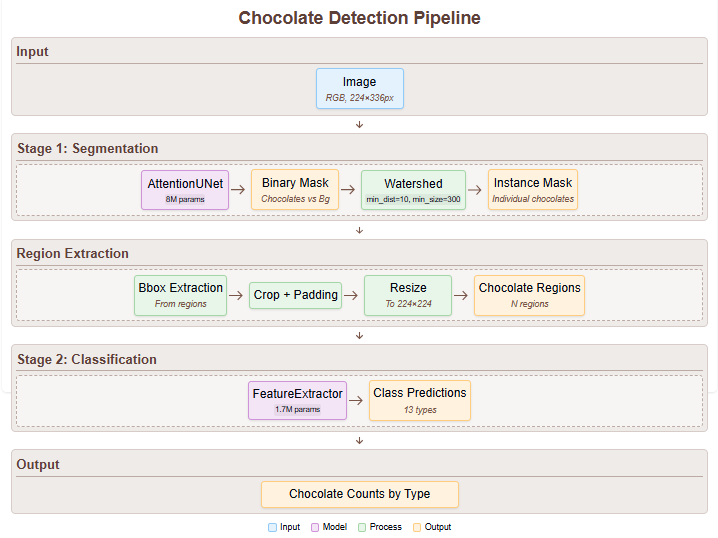

# <span style="color: red;">1. Design Justification</span>


#### 1.1 Two-Stage Pipeline Approach

>We implemented a two-stage pipeline for chocolate detection, breaking the problem into segmentation and classification subtasks, for the following reasons:

>- **Improved accuracy**: Single-stage object detection methods (e.g., YOLO, Faster R-CNN) often struggle with small objects and similar-looking classes. Our approach first focuses on separating chocolates from backgrounds, then classifies each region with specialized features.
>- **Better handling of occlusion**: By detecting chocolates through segmentation first, we can identify partially occluded or overlapping chocolates more effectively than bounding-box approaches.
>- **Resource efficiency**: The two-stage approach allows each model to be smaller and more specialized, helping us stay within the 12 million parameter limit while achieving high performance.

#### 1.2 First Stage: Segmentation with AttentionUNet

>For the segmentation stage, we chose an **AttentionUNet** architecture for these key reasons:

>- **Attention mechanism**: The attention gates help the model focus on relevant features for chocolate segmentation while suppressing background noise. This is particularly important for our dataset with 6 different background types.
>- **Skip connections**: U-Net's skip connections preserve spatial information from encoder to decoder, crucial for accurate boundary detection of chocolates.
>- **Better feature utilization**: Attention gates filter irrelevant features before they reach the decoder, improving localization of small chocolates and handling of complex backgrounds.
>- **Parameter efficiency**: Our implementation uses only ~4.5 million parameters while achieving excellent segmentation performance.

>We enhanced the basic segmentation with **watershed separation** to identify individual chocolates when they touch or overlap. This is critical for accurate counting, as connected chocolates in the binary mask would be counted as a single object otherwise.

#### 1.3 Second Stage: Classification with FeatureExtractor

>For the classification stage, we designed a custom **FeatureExtractor** CNN that:

>- **Balances depth and width**: The network is deep enough to learn discriminative features while staying under the parameter limit.
>- **Employs skip connections**: A skip connection between earlier and later layers helps preserve important visual features that might be lost in deeper layers.
>- **Uses global average pooling**: This reduces parameters while maintaining spatial information better than flattening.
>- **Incorporates regularization**: Dropout and batch normalization prevent overfitting on our limited training data.

#### 1.4 Loss Functions

>- **Segmentation**: We use **BCEDiceLoss** which combines binary cross-entropy and Dice loss. This helps address class imbalance between chocolate and background pixels while optimizing for both pixel accuracy and region overlap.
>- **Classification**: We employ **LabelSmoothingLoss** which prevents the model from becoming overconfident by distributing small probability mass to non-target classes. This improves generalization, especially important with our limited training examples per class.


# <span style="color: red;">2. Technical Implementation</span>


## PIPELINE 

1. [Stage 1: Segmentation](#Stage-1-:-Segmentation)

    1.1 [Binary Segmentation](#Binary-Segmentation)  
    1.2 [Attention UNet Model](#Attention-Unet-Model)  
    1.3 [Watershed Separation](#Watershed-Separation)  
2. [Stage 2: Classification](#Stage-2-:-Classification) 

    2.1 [Feature Extractor Model](#Feature-Extractor-Model)  
    2.2 [Labeling](#Labeling)

# Stage 1 : Segmentation

> The first step of our segmentation process is binary segmentation. Binary segmentation will classify each pixel in an image as belonging to either a chocolate or background, producing a binary mask. 

>Below we can visualize the training dataset containing images and their corresponding mask.

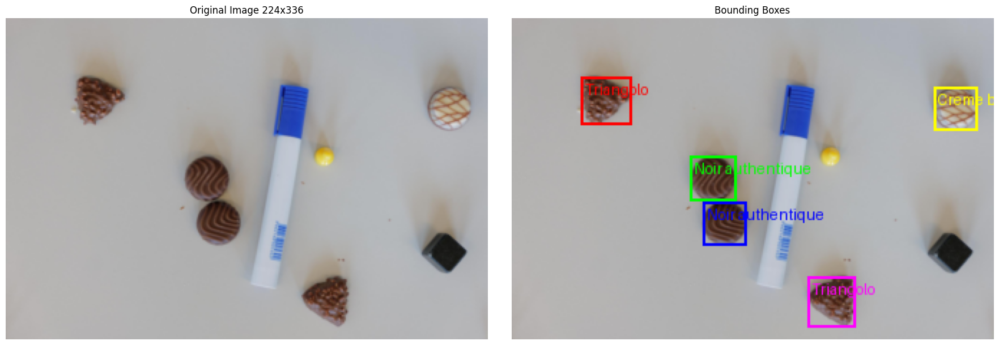
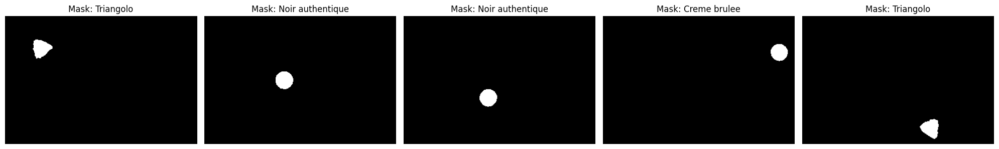

# Binary Segmentation

> First, we create image transforms for segmentation (resize, normalize, and data augmentation when training) for both validation and test images.

> Our binary segmentation training set contains input image, ground-truth mask, and any applied transforms.

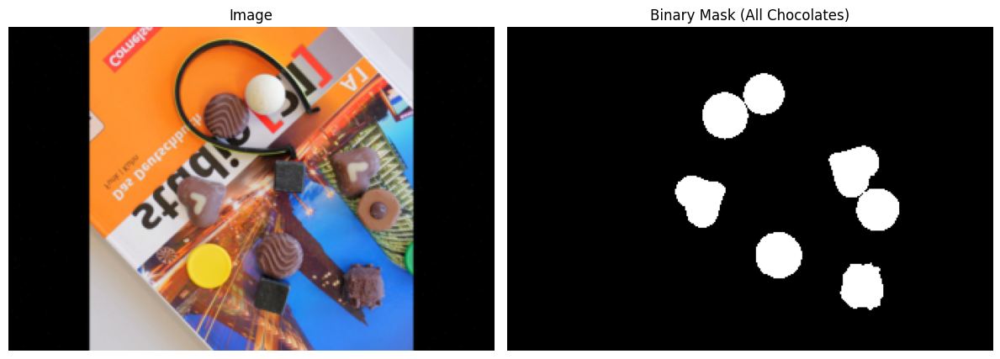

## Attention Unet Model

> An Attention U-Net is an enhanced version of the U-Net architecture for image segmentation that uses attention gates to automatically focus on the most relevant regions of the input image, improving segmentation accuracy by suppressing irrelevant background features and highlighting important structures.

> The model is trained by minimizing a weighted combination of Dice and binary cross-entropy loss using the AdamW optimizer, while a learning rate scheduler reduces the learning rate if the validation performance stops improving.

>Our AttentionUNet contains 8,030,477 parameters and implements the following key components:

>- **Parameter Configuration**: Base feature channels set to 32, with subsequent layers using 64, 128, 256, and 512 channels. This progressive channel expansion allows the network to learn increasingly complex features while maintaining reasonable memory requirements.
>- **Encoder Blocks**: Each block contains two 3×3 convolutions with batch normalization followed by a 2×2 max pooling operation. This downsampling path gradually reduces spatial dimensions while increasing feature depth, capturing context information at multiple scales.
>- **Attention Gate Implementation**: Each gate combines features from encoder and decoder using pointwise convolutions, followed by element-wise addition, ReLU, and sigmoid activation to generate attention coefficients. These gates act as soft region proposals, highlighting relevant spatial regions while suppressing irrelevant background features.
>- **Skip Connection Processing**: Before merging with decoder features, skip connections undergo attention gating to highlight relevant features. This selective feature integration helps propagate spatial details from earlier layers while filtering out irrelevant information.
>- **Output Handling**: The final layer produces a single-channel feature map processed through sigmoid activation during inference, generating probability maps of chocolate presence at each pixel location.


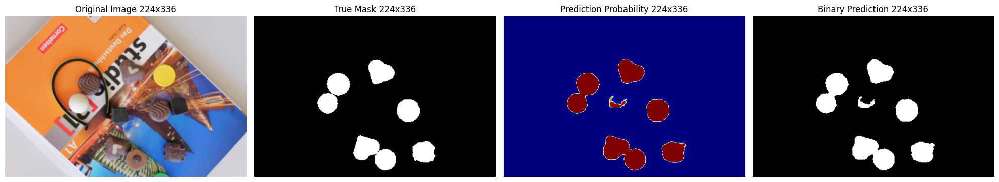

## Watershed Separation

>Watershed separation is an image segmentation method that treats the image as a topographic map, where water floods from low-intensity regions and builds boundaries where different regions meet, effectively separating touching or overlapping objects.

> It is implemented by first computing a gradient image to highlight edges, then generating markers (for foreground and background), and finally applying the watershed algorithm to grow regions from these markers, using pixel intensities as elevation to define boundaries where regions meet.

>This is critical for accurate counting, as connected chocolates in the binary mask would be counted as a single object otherwise.

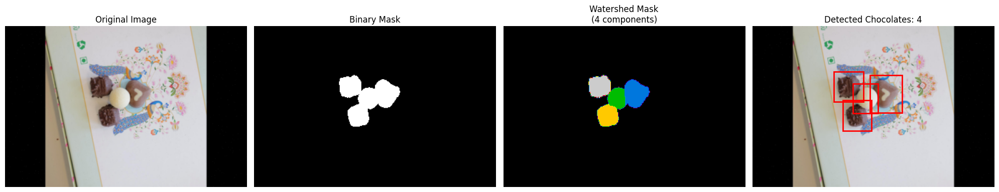


>Our watershed algorithm implementation transforms binary segmentation masks into individually labeled chocolate instances through several key steps:

>- **Distance Transform Computation**: We calculate the Euclidean distance from each foreground pixel to the nearest background pixel. This creates a topographic map where the centers of chocolates form peaks or ridges.
>- **Local Maxima Identification**: Using a minimum distance parameter of 10 pixels, we identify local maxima points that serve as markers for individual chocolates. This parameter was determined experimentally to balance between over-segmentation and under-segmentation.
>- **Marker-Based Watershed**: We apply the watershed algorithm using the negated distance transform and the identified markers. The algorithm treats the distance transform as a landscape and "floods" it from the marker positions, with watershed lines forming at points where different flood basins meet.
>- **Small Region Elimination**: Regions smaller than 300 pixels are removed to eliminate noise and artifacts. This threshold effectively removes small debris while preserving even the smallest legitimate chocolate pieces.

>This approach successfully separates touching or overlapping chocolates without requiring explicit instance segmentation training, significantly reducing computational requirements.

>Our region extraction module performs these technical steps:

>1. **Component Analysis**: For each watershed-labeled region, we calculate centroids, area, and bounding box using region property analysis. This provides the spatial information needed for precise cropping.
>2. **Size Filtering**: Regions with dimensions less than 10×10 pixels are discarded, as they likely .represent noise rather than actual chocolates.
>3. **Adaptive Padding**: We apply differential padding based on the aspect ratio of detected chocolates. Wide chocolates (aspect ratio > 1.5) receive more vertical padding; tall chocolates (aspect ratio < 0.67) receive more horizontal padding; and balanced chocolates receive equal padding in both dimensions. This ensures that each chocolate is properly framed regardless of its shape.
>4. **Resizing**: Each extracted region is resized to 224×224 using bilinear interpolation, maintaining aspect ratio while providing consistent input dimensions for the classification network.

>This adaptive approach ensures that chocolates of varying shapes and orientations are properly extracted with sufficient context for accurate classification.

# Stage 2 : Classification

## Feature Extractor Model

> We created a dataset of cropped chocolate regions (from segmentation). Each sample is a single chocolate image and its class label and it is used to train a classifier or feature-extractor model.

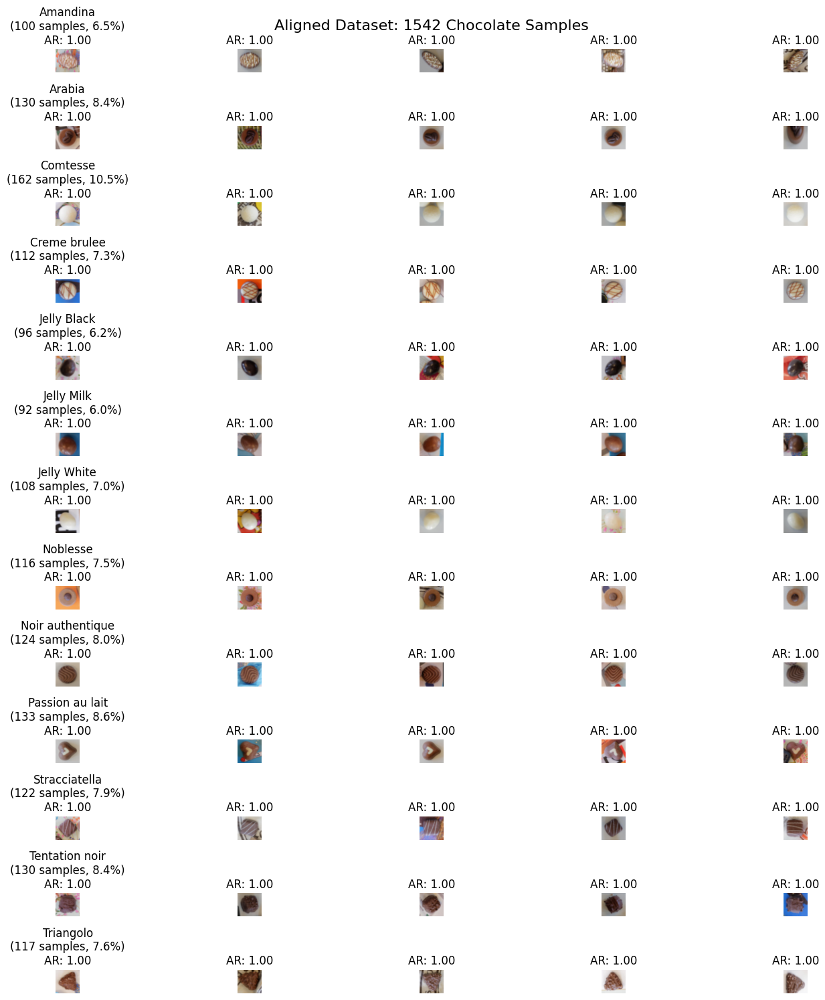

##### Training the FeatureExtractor Model for classification

>The FeatureExtractor implementation includes:

>- **Network Structure**: A five-block convolutional backbone with channel progression of 3→48→96→192→256→384. Each block includes convolution, batch normalization, ReLU activation, and max pooling operations to progressively extract hierarchical features.
>- **Skip Connection Integration**: A direct connection between the third block (192 channels) and final block (384 channels) using pointwise convolution preserves mid-level features that are particularly relevant for chocolate texture and pattern recognition.
>- **Global Feature Pooling**: Average pooling across spatial dimensions produces a compact 384-dimensional feature vector that captures the essential characteristics of each chocolate region.
>- **Classification Head**: A two-layer fully connected network with dimensions 384→256→13, with batch normalization and dropout between layers to prevent overfitting.
>- **Feature Output**: The network provides both class logits and the 384-dimensional feature vector, enabling additional analysis of feature space characteristics and visualization of learned representations.

> The trained model counts 1,715,981 parameters after training. 

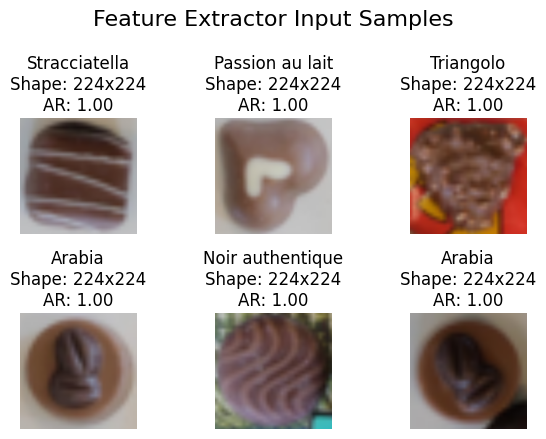

> Once the 224×224 pixel chocolate crops have been processed through the CNN backbone (the “feature extraction” part), the resulting 384-dimensional feature vector is fed through a two-layer, dropout-regularized fully connected head (256 units → batch-norm → ReLU → dropout → final linear layer).

## Labeling

> The final logits go through a softmax, producing class probabilities for each of the 13 chocolate types; the predicted class is simply the one with highest probability. Each region is thus assigned its top-scoring label, and those labels are tallied to produce the per-image class counts.

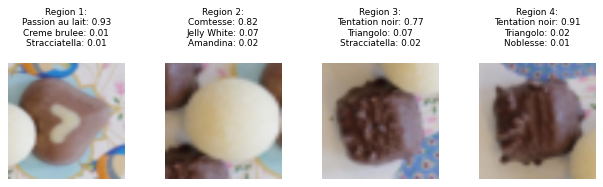

# <span style="color: red;">3. Qualitative Evaluation of the Pipeline</span>

This section provides a visual and descriptive assessment of our two-stage chocolate recognition pipeline. We first analyze the performance of the **Attention U-Net** segmentation and subsequent **watershed-based instance separation**. We then evaluate the **Feature Extractor's** classification accuracy on the resulting chocolate crops. Finally, we examine **end-to-end examples** to illustrate the pipeline's strengths and identify areas for potential improvement.

---

## 3.1 Stage 1: Segmentation and Instance Separation


The initial stage is critical for isolating individual chocolate instances. It involves:

- **Binary segmentation** using an **Attention U-Net**
- **Instance separation** via the **watershed algorithm**

---

> The dataset is split into training and validation sets using stratified sampling based on the background labels, ensuring that each background type is proportionally represented in both subsets.

![Background Distribution](images_report/back_distrib.png)  
*Background distribution of the training and validation sets.*

---

> The Attention U-Net model trained effectively, achieving high segmentation performance with stable loss convergence, strong and consistent IoU and Dice scores on both training and validation sets, and well-timed learning rate reductions, indicating good generalization and minimal overfitting.

### 3.1.1 Attention U-Net: Binary Segmentation Performance

The Attention U-Net is trained to produce a binary mask distinguishing chocolate pixels from the background. Its performance is evaluated on the validation set.

Training History:

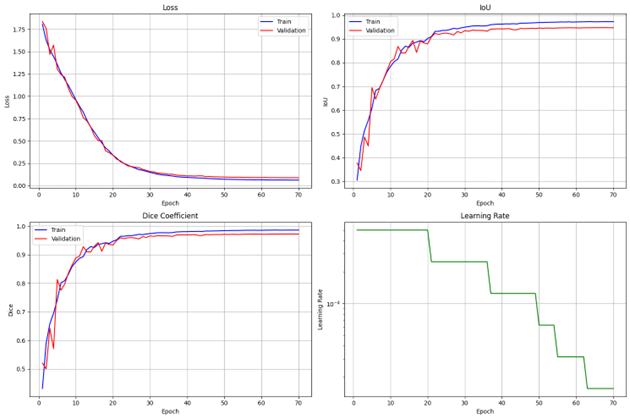

*Figure 3.1: Training and validation curves of the Attention U-Net. The model achieves a validation Dice score of approximately 0.98 and a validation loss around 0.10, indicating good generalization.*

---

Visual Examples of Segmentation:

>Each row shows:  
(a) Original Image (b) Ground Truth Mask (c) Probability Map (sigmoid output) (d) Thresholded Binary Mask

#### Figure 3.2.1: Successful Segmentation on [Neutral/Noisy] Background (Validation Image ID: `L1000974_2.jpg`)

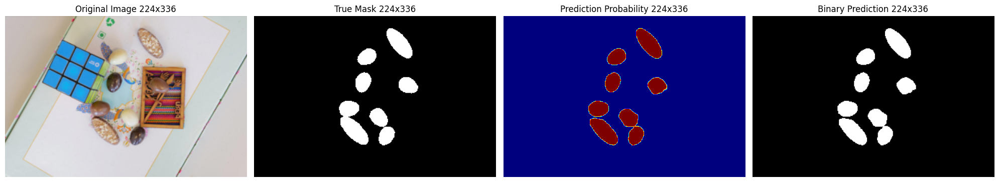
*The Attention U-Net accurately segments chocolates on a PLastic type background. The probability map (c) shows high confidence, and the binary mask (d) closely matches the ground truth (b).*

#### Figure 3.2.2: Segmentation with Multiple Chocolates on Book Background(Validation Image ID: `L1000923_2.jpg`)
![Segmentation Example 2](images_report/unet_2.png)  
Even with multiple chocolates of varying types, the model effectively distinguishes them from the background, producing a clean composite mask.*

#### Figure 3.2.3: Challenging Case 1 – Chocolates being divided due to overlapping objects (Validation Image ID: `L1000979_2.jpg`)
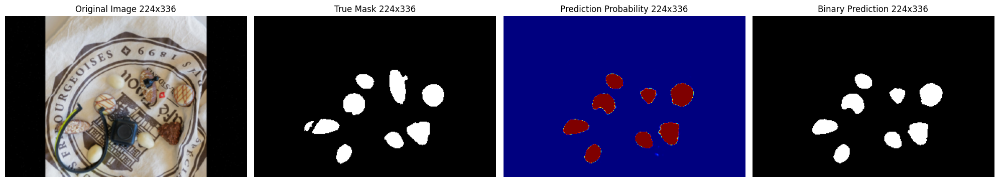
*For long chocolates like Amandina, segmentation remains effective despite background challenges and superposing objects. We can see that despite the horse-shoe object cutting one in two zones, the models correctly identifies takes 1 zone only.*



#### Figure 3.2.3: Challenging Case 2 – Packed Chocolates forming a single blob (Validation Image ID: `L1000876_2.jpg`)
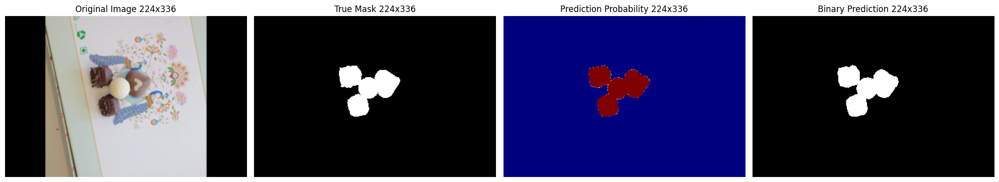
*Packed chocolates form a single connected blob in the segmentation mask, which if not post-processed would be considered as a single chocolate region.*



#### Figure 3.2.3: Challenging Case 3– Chocolate lighting and contrast with the background (Validation Image ID: `L1010019_3.jpg`)
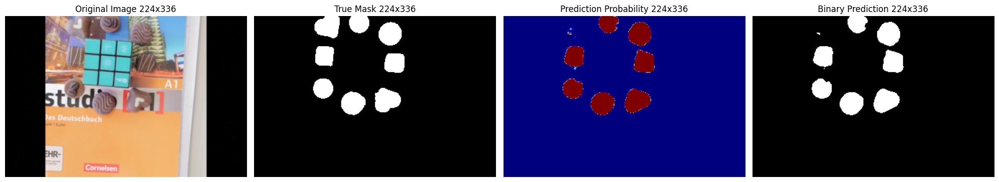
*Here the Passion au Lait zone is difficultly identified due to low-contrast between it and the background.*

---

>**Analysis:**  
The Attention U-Net produces high-quality binary masks. Attention gates enhance robustness to background variation. Lower-confidence areas typically align with edges or low-contrast zones. The primary challenge observed is the merging of touching or closely packed chocolates into a single blob in the binary mask, which necessitates the subsequent watershed separation step.

---

### 3.1.2 Watershed Algorithm: Separating Touching Instances

>Post-segmentation, we apply the watershed algorithm to separate touching or overlapping chocolates.

#### Figure 3.3.1: Successful Watershed Separation of Touching Chocolates (Validation Index: `L1000876_2.jpg`)
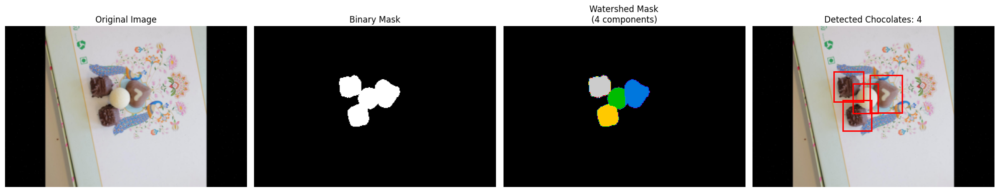
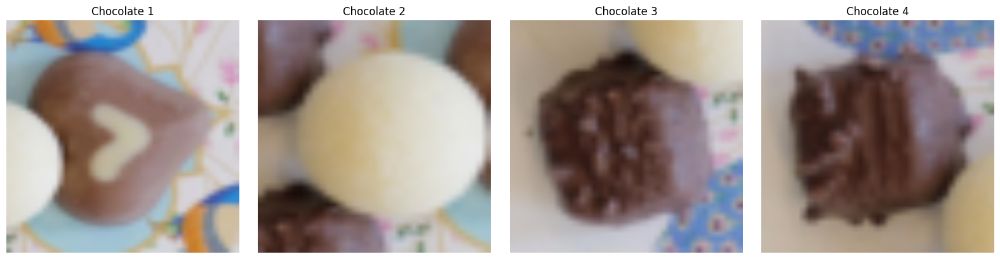
*The U-Net's binary mask shows merged chocolates. Watershed delineates 4 distinct instances for classification and successfully separates chocolates in densely packed scenes. Tuning of `min_distance` prevents oversegmentation of most cases.*

#### Figure 3.3.2: Difficult case over-segmentation (Validation Index: `L1000952_3.jpg`)
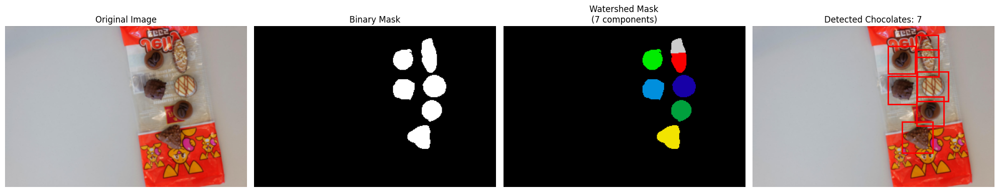
*`min_distance` and `min_size` are key parameters in the watershed algorithm that control how close detected objects can be (min_distance) and the minimum area required to consider a region as a valid instance (min_size). Although these parameters were carefully tuned to handle most difficult cases, in this example, a single large chocolate was mistakenly split into two separate instances because its size and shape triggered over-segmentation.*

---

>**Analysis:**  
The watershed algorithm, with min_distance tuned to 10 and min_size around 300, effectively separates most touching instances. Its performance is key to enabling correct instance counting. The primary limitations arise from the quality of the input binary mask from the U-Net: if the U-Net completely fails to detect a boundary, watershed cannot create one itself.

---

## 3.2 Stage 2: Classification of Extracted Regions

>Following segmentation and instance separation, each crop is fed to a CNN-based Feature Extractor for classification into one of 13 chocolate types.

---

### 3.2.1 Training Performance

Training History of Feature Extractor:

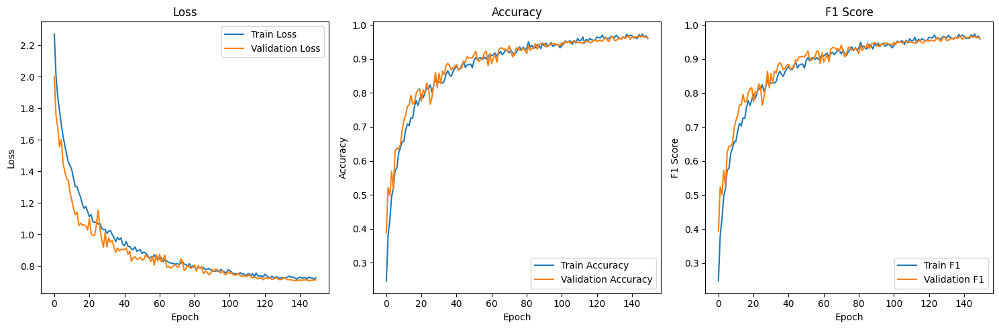
*Figure 3.4: The feature-extractor converges cleanly, with both training and validation loss steadily falling from ~2.3 to ~0.7 and the validation curve closely tracking the training curve, indicating minimal overfitting. Accuracy and F1 scores climb above 90% by epoch 50 and plateau around 97%, demonstrating strong generalization across classes.*

---

### 3.2.2 Quality of Aligned Crops for Classifier Training and Class Distribution

>The classifier is trained on aligned crops generated from Stage 1 outputs matched to ground truth via IoU. As shown in Section 2: Feature Extractor Input. 

#### Figure 3.5: Class Distribution
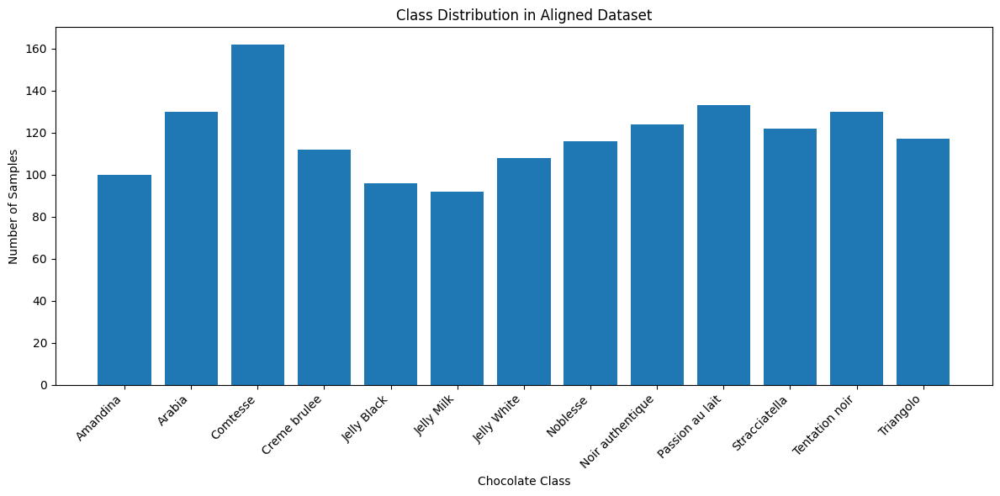
*Some chocolate classes are overrepresented, while others have fewer examples, leading to an imbalanced distribution.*


>**Analysis:**  
The aligned training dataset is representative of what the classifier sees during inference, as it is constructed from Stage 1 crops. The use of adaptive padding and aspect-ratio preservation helps retain key shape and size information across classes.
However, the class imbalance - as visualized in Figure 3.5 - can impact classifier generalization, particularly for underrepresented chocolate types. This may lead to biased predictions toward dominant classes, especially in cluttered or ambiguous scenes.

---

### 3.2.3 Classification Performance on Extracted Regions

We now present end-to-end examples from the full pipeline.

#### Figure 3.6.1: Successful Detection and Classification (Validation Index: `L1000923_3.jpg`)
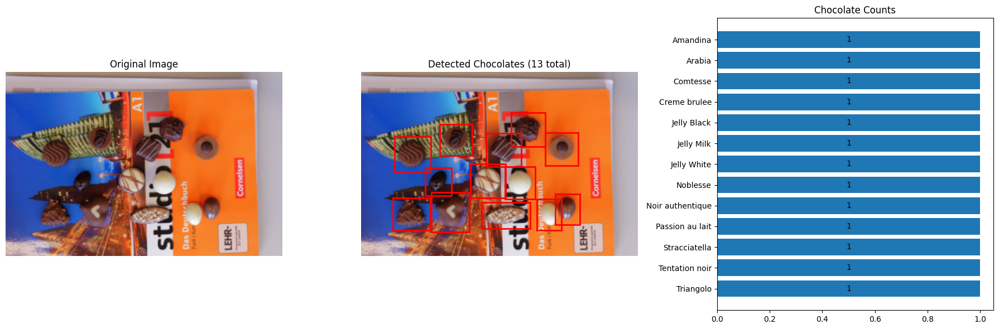
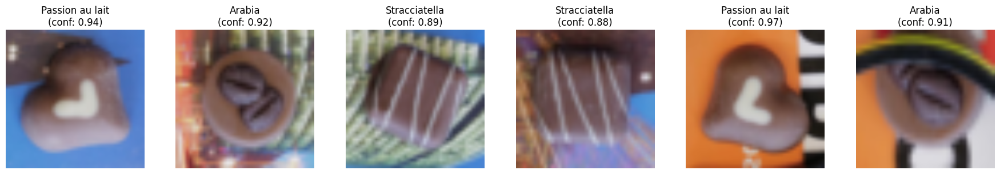
*The original image is processed end-to-end, successfully extracting and classifying all 13 chocolate types. Each prediction achieves a confidence score above 70%. Slightly lower confidence values—such as for `Crème Brûlée`—may be attributed to background noise, while others like `Jelly White` may be affected by its lower representation in the training data.*

#### Figure 3.6.2: Correct Classification in a Cluttered Scene (Validation Index: `L1010022_3.jpg`)
![Pipeline Example 2](images_report/correct_val2_image.png)
![Pipeline Example 2.1](images_report/correct_val2.png)  
*Despite a cluttered background with the horseshoe object obstructing chocolates, the model correctly identifies chocolates like `Arabia`.*

---

### Challenging Cases and Misclassifications

#### Figure 3.7.1: Misclassification due to Ambiguous Crop (Test Index: `L1000877.JPG`)
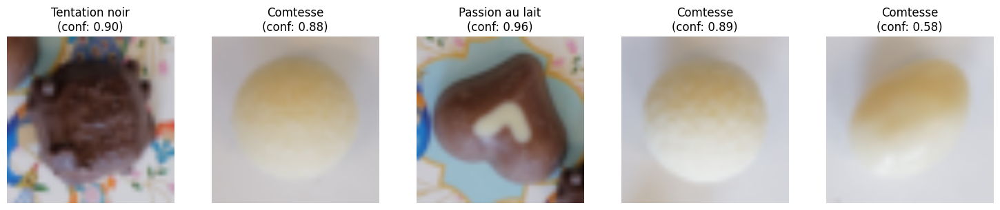
*A crop of `Jelly White` was misclassified as `Comtesse` (confidence: 58%) due to the strong visual similarity between the two chocolate types. Additionally, the similar lighting conditions and neutral background failed to provide enough contrast, making it difficult for the model to distinguish between them accurately.*

#### Figure 3.7.2: Missclassification due to Shape and Color (Test Index: `L1000856.JPG`)
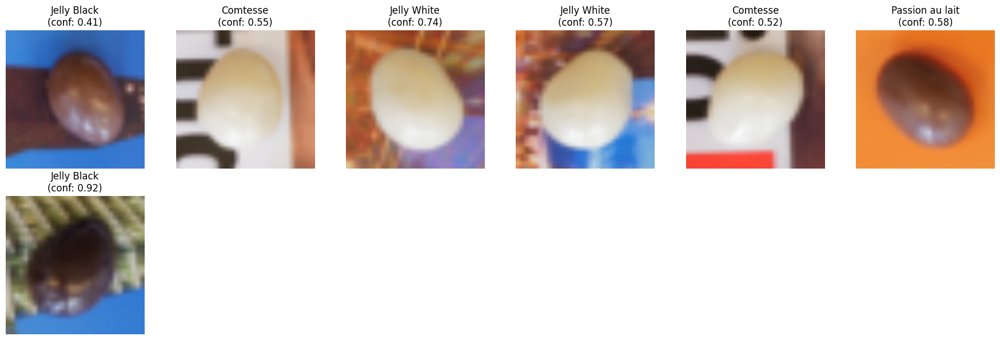
*These misclassifications appears to stem from both shape and color ambiguity. The extracted region has a rounded, uniform appearance and a smooth surface texture, making the `Jelly Milk` visually similar to chocolates like `Passion au lait` or `Jelly Black`. Same case for `Jelly White` being misslassified as `Comtesse`.*

---


## 3.3 Overall Pipeline Behavior and Insights

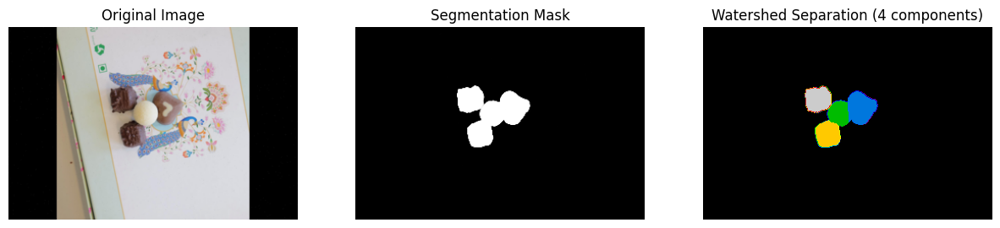
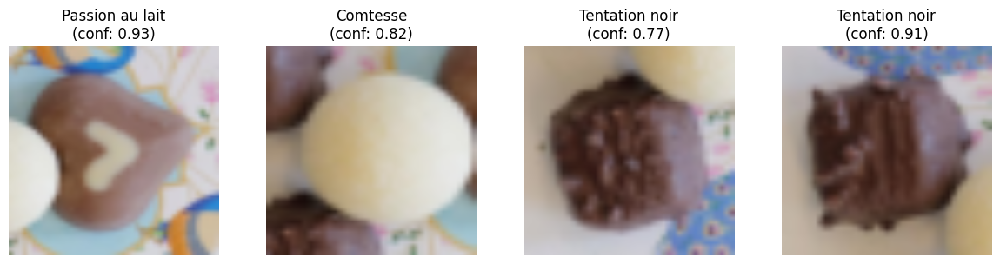
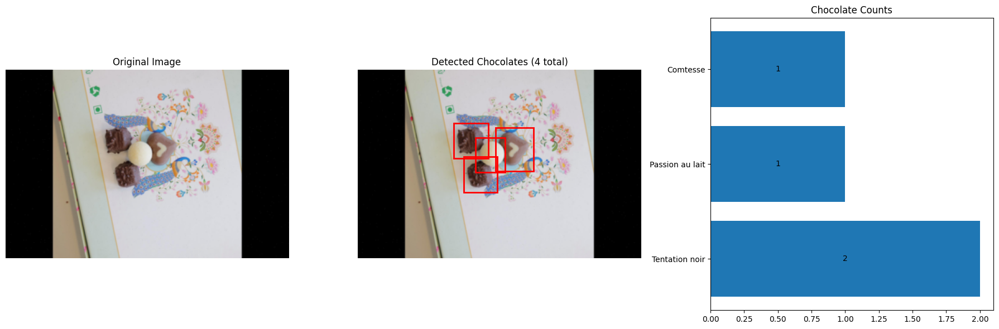
*The full pipeline. From Segmentation to Classification.*


---

### Strengths

#### High Overall Performance

* Model achieves \~97% validation accuracy and F1 score
* Good convergence shown in training plots
* Successfully handles most standard cases with confidence scores > 70%

#### Architecture Design

* Efficient feature extraction with 5-block CNN backbone
  *(channels: 3 → 48 → 96 → 192 → 256 → 384)*
* Skip connections preserve important visual details
* Global average pooling reduces parameters while maintaining spatial information
* Two-layer classification head with dropout helps prevent overfitting

#### Training Approach

* Label smoothing loss prevents overconfidence
* Uses adaptive padding and aspect ratio preservation
* Early stopping based on validation performance

---

### Weaknesses

#### Class Confusion Patterns

* Inter-class similarity issues:

  * `Jelly White` vs `Comtesse`
  * `Jelly Milk` vs `Passion au Lait` / `Jelly Black`
* Shape and texture ambiguity for rounded chocolates
* Lower confidence scores on visually similar pairs

#### Data Distribution Challenges

* Imbalanced class distribution impacts rare chocolate types
* Limited examples of chocolates in unusual orientations
* Underrepresented lighting/background combinations

#### Propagated Issues

* Classification errors compound with segmentation mistakes
* Over-segmented regions from watershed lead to split predictions
* Confidence scores affected by crop quality

---


### Potential Future Improvement: Copy-Paste Augmentation
As discussed by Ghiasi et al. in "Simple Copy-Paste is a Strong Data Augmentation Method for Instance Segmentation," incorporating copy-paste augmentation during the training of the Stage 1 U-Net could further enhance its robustness and balance class distribution. This technique involves randomly pasting segmented object instances (in our case, reference chocolates with their masks) onto training images.

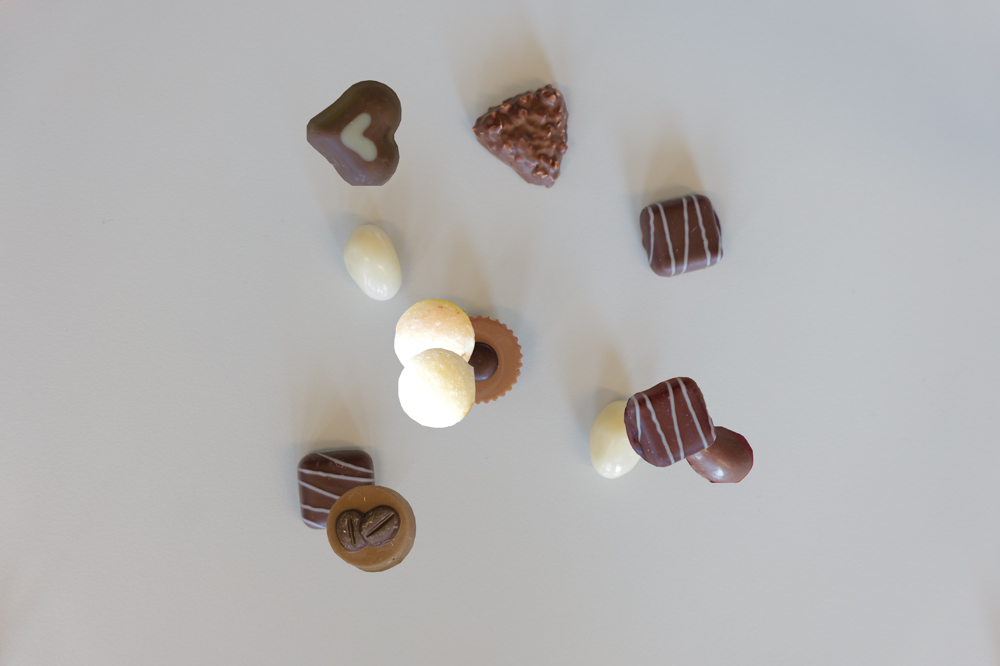
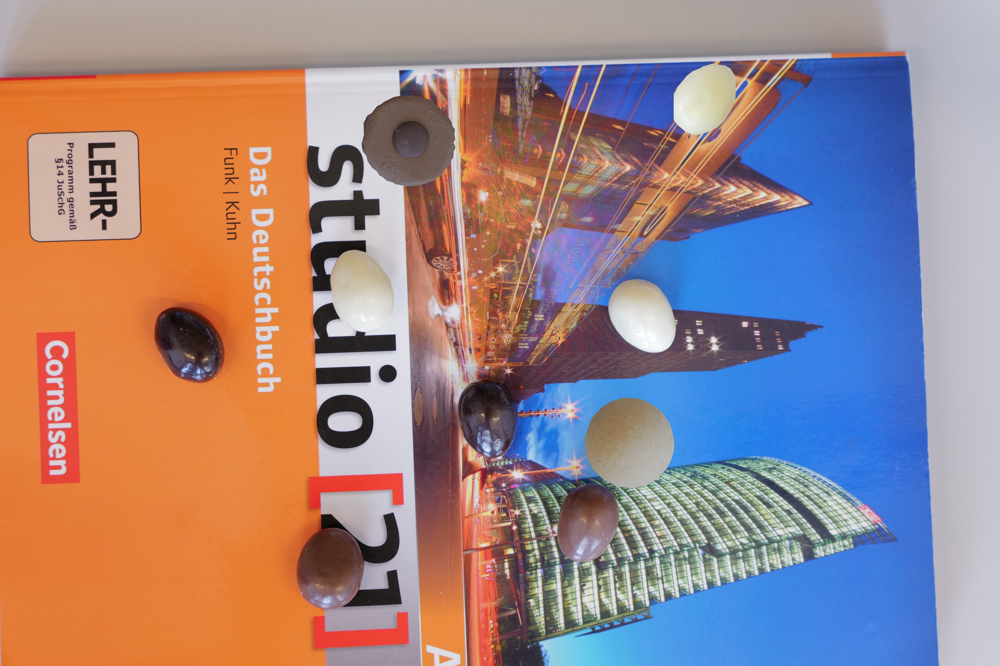
*Examples of images with copy-paste augmentation applied to them, each training image contains crops of reference chocolates pasted on to them, essentially creating a new training images synthetically.*